# Modelo de Rede U-Net com Backbone Densenet-121 Pré-Treinada

Conecta com base de dados armazenados no Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Importação de bibliotecas para execução construção e visualização do modelo e do conjunto de dados

In [2]:
import tensorflow as tf
import numpy as np
import pandas as pd
import six

from random import randint

from sklearn.model_selection import train_test_split

from skimage.transform import resize
from scipy.ndimage import morphology as mp

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import load_img
from tensorflow.python.keras.utils.data_utils import get_file
from tensorflow.keras.utils import get_source_inputs
from tensorflow.keras.layers import InputSpec
from tensorflow.keras.layers import Conv2D, UpSampling2D, Conv2DTranspose, MaxPooling2D, Concatenate
from tensorflow.keras.layers import Activation, SpatialDropout2D
from tensorflow.keras.layers import Input, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import img_to_array

from tqdm import tqdm_notebook

from keras import Model
from keras.utils import plot_model
from keras.saving import register_keras_serializable
from keras.utils import Sequence
from keras.losses import binary_crossentropy, BinaryCrossentropy
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.optimizers import Adam
from keras.models import load_model
from keras import initializers
from keras import regularizers
from keras import constraints
from keras import backend as K
from keras.regularizers import l2
from keras.applications import DenseNet121

import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8-white')
import seaborn as sns
sns.set_style("white")

In [3]:
from os import listdir

image_path = '/content/drive/MyDrive/TCC/images_cut/'
labels_path = '/content/drive/MyDrive/TCC/labels_cut/'

file_names = [filename for filename in listdir(image_path)]
train_files, val_files = train_test_split(file_names, test_size=0.16, random_state=13)

train_imgs= [image_path + i for i in train_files]
train_masks= [ labels_path + i for i in train_files]

val_imgs = [image_path + i for i in val_files]
val_masks = [labels_path + i for i in val_files]

In [4]:
img_size_ori = 101
img_size_target = (224, 840)
img_w_target = 224
img_h_target = 224

def upsample(img):
    if img_size_ori == img_size_target:
        return img
    return resize(img, (img_w_target, img_h_target), mode='constant', preserve_range=True)

def downsample(img):
    return resize(img, (img_w_target, img_h_target), mode='constant', preserve_range=True)

Classe geradora de dados. Evita com que todas as imagens sejam carregas em memória durante o tempo de execução. Cada batch irá ser carregado em demanda.

Referência para o padrão: https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly

São aplicados os filtros de erosão binária e dilatação binária nas máscaras. A erosão binária irá reduzir o tamanha da máscara, removendo possíveis ruídos na segmentação. O processo seguinte, de dilatação, irá aumentar novamente a máscara reduzida, tornando-a mais prevalente na imagem de verdade fundamental

Fonte: https://www.cs.auckland.ac.nz/courses/compsci773s1c/lectures/ImageProcessing-html/topic4.htm

In [5]:
class DataGenerator(Sequence):

    def __init__(self,
                 images,
                 labels,
                 batch_size=16,
                 dim=(224,224,3),
                 shuffle=True):
        self.dim = dim
        self.images = images
        self.labels = labels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.images) / self.batch_size))

    def __getitem__(self, index):
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        list_IDs_temp = [k for k in indexes]

        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.images))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        batch_imgs = list()
        batch_labels = list()

        for i in list_IDs_temp:
            img = load_img(self.images[i], target_size=self.dim, grayscale=False)
            img = img_to_array(img)/255
            batch_imgs.append(img)
            label = load_img(self.labels[i], target_size=self.dim, grayscale=False)
            label = img_to_array(label)[:,:,0]
            label = label != 0
            label = mp.binary_erosion(mp.binary_erosion(label))
            label = mp.binary_dilation(mp.binary_dilation(mp.binary_dilation(label)))
            label = np.expand_dims((label)*1 , axis=2)
            batch_labels.append(label)

        return np.array(batch_imgs, dtype = np.float32), np.array(batch_labels,
                                                                  dtype = np.float32)

In [6]:
def display_sample(data_tuple, img_shape):
    X,y = data_tuple
    plt.figure(figsize=(8,8))
    plt.subplot(121)
    plt.imshow(X[0])
    plt.subplot(122)
    plt.imshow(np.reshape(y[0], img_shape))

In [7]:
batch_size = 16
train_generator = DataGenerator(train_imgs, train_masks, batch_size=batch_size,
                                dim=(img_w_target,img_h_target, 3), shuffle=True)
train_generator.__getitem__(1)
train_steps = train_generator.__len__()

<ipython-input-5-7706036e9a64>:44: DeprecationWarning: Please use `binary_erosion` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  label = mp.binary_erosion(mp.binary_erosion(label))
<ipython-input-5-7706036e9a64>:45: DeprecationWarning: Please use `binary_dilation` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  label = mp.binary_dilation(mp.binary_dilation(mp.binary_dilation(label)))


Amostra de imagem e máscara de treino

<ipython-input-5-7706036e9a64>:44: DeprecationWarning: Please use `binary_erosion` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  label = mp.binary_erosion(mp.binary_erosion(label))
<ipython-input-5-7706036e9a64>:45: DeprecationWarning: Please use `binary_dilation` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  label = mp.binary_dilation(mp.binary_dilation(mp.binary_dilation(label)))


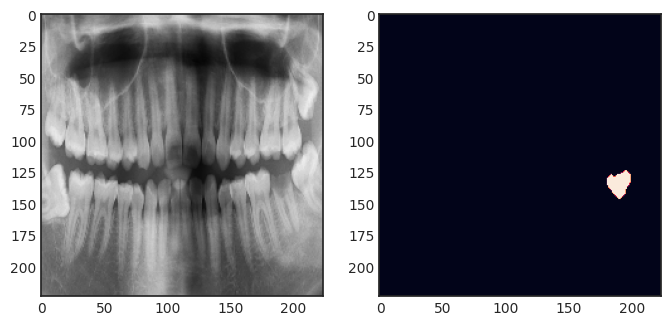

In [8]:
display_sample(train_generator.__getitem__(3), (img_w_target,img_h_target))

In [9]:
val_generator = DataGenerator(val_imgs, val_masks, batch_size=batch_size,
                              dim=(img_w_target,img_h_target, 3), shuffle=True)
val_steps = val_generator.__len__()
val_images = val_generator.images

Amostra de imagem e máscara de validação

<ipython-input-5-7706036e9a64>:44: DeprecationWarning: Please use `binary_erosion` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  label = mp.binary_erosion(mp.binary_erosion(label))
<ipython-input-5-7706036e9a64>:45: DeprecationWarning: Please use `binary_dilation` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  label = mp.binary_dilation(mp.binary_dilation(mp.binary_dilation(label)))


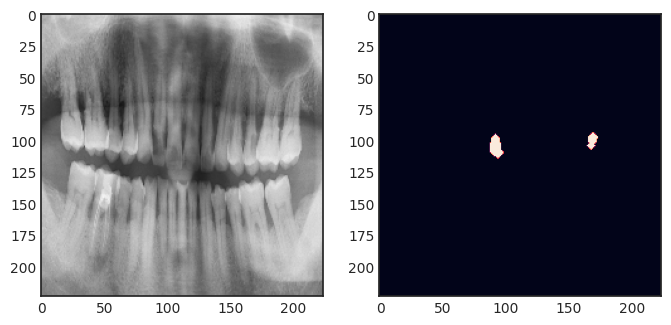

In [10]:
display_sample(val_generator.__getitem__(0), (img_w_target, img_h_target))

### Construindo o Modelo U-Net

In [11]:
def __unet_conv_bn_relu(**conv_params):
    filters = conv_params["filters"]
    kernel_size = conv_params["kernel_size"]
    strides = conv_params.setdefault("strides", (1, 1))
    kernel_initializer = conv_params.setdefault("kernel_initializer", "he_normal")
    padding = conv_params.setdefault("padding", "same")

    def f(input):
        conv = Conv2D(filters=filters, kernel_size=kernel_size,
                      strides=strides, padding=padding,
                      kernel_initializer=kernel_initializer)(input)

        norm = BatchNormalization()(conv)
        return Activation("relu")(norm)

    return f

def Upsample2D_block(filters, kernel_size=(3,3), upsample_rate=(2,2), skip=None):

    def layer(input_tensor):

        x = UpSampling2D(size=upsample_rate)(input_tensor)

        if skip is not None:
            x = Concatenate()([x, skip])

        x = __unet_conv_bn_relu(filters=filters, kernel_size=kernel_size)(x)

        x = __unet_conv_bn_relu(filters=filters, kernel_size=kernel_size)(x)

        return x
    return layer


In [12]:
def UnetDenseNet(input_shape):
    inputs = Input(input_shape, name = 'input')
    densenet = DenseNet121(include_top = False, weights = 'imagenet', pooling = 'max',
                        input_tensor = inputs, input_shape = input_shape)

    skip1 = densenet.get_layer("input").output
    skip2 = densenet.get_layer("conv1/conv").output
    skip3 = densenet.get_layer("pool2_relu").output
    skip4 = densenet.get_layer("pool3_relu").output

    center = densenet.get_layer("pool4_relu").output

    d1 = Upsample2D_block(filters=512, skip=skip4)(center)
    d2 = Upsample2D_block(filters=256, skip=skip3)(d1)
    d3 = Upsample2D_block(filters=128, skip=skip2)(d2)
    d4 = Upsample2D_block(filters=54,  skip=skip1)(d3)

    x = Conv2D(1, (3), padding="same", name='final_conv')(d4)
    x = Activation('sigmoid', name='sigmoid')(x)

    model = Model(inputs, x, name="DenseNet_U-Net")
    return model

29084464/29084464 [==============================] - 0s 0us/step
Model: "DenseNet_U-Net"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input (InputLayer)          [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input[0][0]']               
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNorm

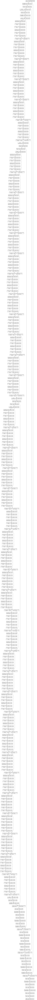

In [13]:
model = UnetDenseNet(input_shape=(img_w_target,img_h_target, 3))
model.summary()
plot_model(model, show_shapes=True)

In [ ]:
alpha = 0.25
gamma = 2

@register_keras_serializable(package="unetVgg16", name="jaccard_index")
def jaccard_index(y_true, y_pred):
    # https://en.wikipedia.org/wiki/Jaccard_index
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)

    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum((y_true_f + y_pred_f) - (y_true_f * y_pred_f))
    return 1 - (intersection / union)

@register_keras_serializable(package="unetVgg16", name="dice_coef")
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred = K.cast(y_pred, 'float32')
    y_pred_f = K.cast(K.greater(K.flatten(y_pred), 0.5), 'float32')
    intersection = y_true_f * y_pred_f
    score = 2. * K.sum(intersection) / (K.sum(y_true_f) + K.sum(y_pred_f))
    return score

@register_keras_serializable(package="unetVgg16", name="generalized_dice_coefficient")
def generalized_dice_coefficient(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (
            K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

@register_keras_serializable(package="unetVgg16", name="dice_loss")
def dice_loss(y_true, y_pred):
    loss = 1 - generalized_dice_coefficient(y_true, y_pred)
    return loss

@register_keras_serializable(package="unetVgg16", name="soft_dice")
def soft_dice(y_true, y_pred, axis=(0, 1, 2), epsilon=0.00001):
    dice_numerator = (2 * K.sum(y_pred * y_true, axis = axis)) + epsilon
    dice_denominator = K.sum(y_pred * y_pred, axis = axis) + K.sum(y_true * y_true,
                                                                   axis=axis) + epsilon
    softDice_loss = 1 - K.mean(dice_numerator/dice_denominator)
    return softDice_loss

@register_keras_serializable(package="unetVgg16", name="bce_softDice_loss")
def bce_softDice_loss(y_true, y_pred):
    w1 = 0.6
    w2 = 0.4
    loss = w1 * binary_crossentropy(y_true, y_pred) + w2 * soft_dice(y_true,y_pred)
    return loss

@register_keras_serializable(package="unetVgg16", name="log_cosh_dice_loss")
def log_cosh_dice_loss(y_true, y_pred):
    x = dice_loss(y_true, y_pred)
    return tf.math.log((tf.exp(x) + tf.exp(-x)) / 2.0)

@register_keras_serializable(package="unetVgg16", name="bce_dice_loss")
def bce_dice_loss(y_true, y_pred):
    return (binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)) / 2.0

@register_keras_serializable(package="unetVgg16", name="focal_loss_with_logits")
def focal_loss_with_logits(logits, targets, alpha, gamma, y_pred):
    weight_a = alpha * (1 - y_pred) ** gamma * targets
    weight_b = (1 - alpha) * y_pred ** gamma * (1 - targets)

    return (tf.math.log1p(tf.exp(-tf.abs(logits))) + tf.nn.relu(
        -logits)) * (weight_a + weight_b) + logits * weight_b

@register_keras_serializable(package="unetVgg16", name="focal_loss")
def focal_loss(y_true, y_pred):
    y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(),
                              1 - tf.keras.backend.epsilon())
    logits = tf.math.log(y_pred / (1 - y_pred))
    loss = focal_loss_with_logits(logits=logits, targets=y_true,
                                       alpha=alpha, gamma=gamma, y_pred=y_pred)
    return tf.reduce_mean(loss)

@register_keras_serializable(package="unetVgg16", name="tversky_index")
def tversky_index(y_true, y_pred):
    smooth = 1
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1 - y_pred_pos))
    false_pos = K.sum((1 - y_true_pos) * y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth) / (true_pos + alpha * false_neg + (
                1 - alpha) * false_pos + smooth)

@register_keras_serializable(package="unetVgg16", name="tversky_loss")
def tversky_loss(y_true, y_pred):
    return 1 - tversky_index(y_true, y_pred)

@register_keras_serializable(package="unetVgg16", name="focal_tversky")
def focal_tversky(y_true, y_pred):
    pt_1 = tversky_index(y_true, y_pred)
    gamma = 0.75
    return K.pow((1 - pt_1), gamma)

@register_keras_serializable(package="unetVgg16", name="ssim_loss")
def ssim_loss(y_true, y_pred):
    """
    Structural Similarity Index (SSIM) loss
    """
    return 1 - tf.image.ssim(y_true, y_pred, max_val=1)

@register_keras_serializable(package="unetVgg16", name="basnet_hybrid_loss")
def basnet_hybrid_loss(y_true, y_pred):
    """
    Hybrid loss proposed in BASNET (https://arxiv.org/pdf/2101.04704.pdf)
    The hybrid loss is a combination of the binary cross entropy, structural similarity
    and intersection-over-union losses, which guide the network to learn
    three-level (i.e., pixel-, patch- and map- level) hierarchy representations.
    """
    bce_loss = BinaryCrossentropy(from_logits=False)
    bce_loss = bce_loss(y_true, y_pred)

    ms_ssim_loss = (y_true, y_pred)
    j_loss = jaccard_index(y_true, y_pred)

    return bce_loss + ms_ssim_loss + j_loss

@register_keras_serializable(package="unetVgg16", name="unet3p_hybrid_loss")
def unet3p_hybrid_loss(y_true, y_pred):
    """
    Hybrid loss proposed in UNET 3+ (https://arxiv.org/ftp/arxiv/papers/2004/2004.08790.pdf)
    Hybrid loss for segmentation in three-level hierarchy – pixel, patch and map-level,
    which is able to capture both large-scale and fine structures with clear boundaries.
    """
    f_loss = focal_loss(y_true, y_pred)
    ms_ssim_loss = ssim_loss(y_true, y_pred)
    j_loss = jaccard_index(y_true, y_pred)

    return f_loss + ms_ssim_loss + j_loss

@register_keras_serializable(package="unetVgg16", name="get_iou_vector")
def get_iou_vector(A, B):
    batch_size = A.shape[0]
    metric = []
    for batch in range(batch_size):
        t, p = A[batch]>0, B[batch]>0
        intersection = np.logical_and(t, p)
        union = np.logical_or(t, p)
        iou = (np.sum(intersection > 0) + 1e-10 )/ (np.sum(union > 0) + 1e-10)
        thresholds = np.arange(0.5, 1, 0.05)
        s = []
        for thresh in thresholds:
            s.append(iou > thresh)
        metric.append(np.mean(s))

    return np.mean(metric)

@register_keras_serializable(package="unetVgg16", name="iou_metric")
def iou_metric(label, pred):
    return tf.py_function(get_iou_vector, [label, pred>0.5], np.float32)


In [ ]:
model.compile(optimizer='adam', loss=bce_dice_loss, metrics = ['accuracy', tf.keras.metrics.MeanIoU(num_classes=2)])
mc = ModelCheckpoint(mode='max', filepath='/content/drive/MyDrive/TCC/top.model.keras',
                     save_best_only='True', save_weights_only='True', verbose=1)
callbacks = [mc]
model.metrics_names

[]

In [ ]:
model_history =  model.fit(train_generator, steps_per_epoch=train_steps,epochs=80,
                           validation_data=val_generator,validation_steps=val_steps)

<ipython-input-9-7706036e9a64>:44: DeprecationWarning: Please use `binary_erosion` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  label = mp.binary_erosion(mp.binary_erosion(label))
<ipython-input-9-7706036e9a64>:45: DeprecationWarning: Please use `binary_dilation` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  label = mp.binary_dilation(mp.binary_dilation(mp.binary_dilation(label)))


Epoch 1/80
5/5 [==============================] - 104s 5s/step - loss: 0.6168 - accuracy: 0.9060 - mean_io_u: 0.4982 - val_loss: 0.5697 - val_accuracy: 0.9952 - val_mean_io_u: 0.4976
Epoch 2/80
5/5 [==============================] - 7s 2s/step - loss: 0.5089 - accuracy: 0.9961 - mean_io_u: 0.4981 - val_loss: 1.0169 - val_accuracy: 0.9952 - val_mean_io_u: 0.4976
Epoch 3/80
5/5 [==============================] - 5s 1s/step - loss: 0.4968 - accuracy: 0.9962 - mean_io_u: 0.4981 - val_loss: 3.1413 - val_accuracy: 0.9952 - val_mean_io_u: 0.4976
Epoch 4/80
5/5 [==============================] - 4s 876ms/step - loss: 0.4809 - accuracy: 0.9962 - mean_io_u: 0.4981 - val_loss: 0.9527 - val_accuracy: 0.9952 - val_mean_io_u: 0.4976
Epoch 5/80
5/5 [==============================] - 5s 882ms/step - loss: 0.4978 - accuracy: 0.9954 - mean_io_u: 0.4981 - val_loss: 0.7261 - val_accuracy: 0.9952 - val_mean_io_u: 0.4976
Epoch 6/80
5/5 [==============================] - 4s 874ms/step - loss: 0.4541 - accura

In [ ]:
model.save('/content/drive/MyDrive/TCC/densenet.model.keras')
model.save_weights('/content/drive/MyDrive/TCC/densenet.weights.keras')

In [ ]:
model_history.history.keys()

dict_keys(['loss', 'accuracy', 'mean_io_u', 'val_loss', 'val_accuracy', 'val_mean_io_u'])

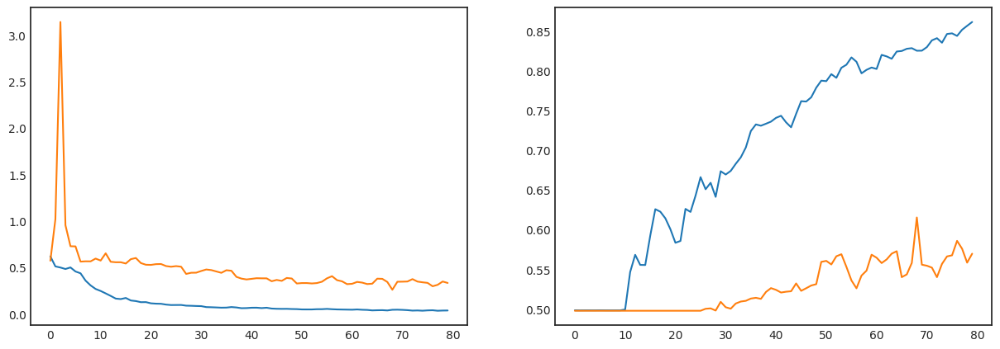

In [ ]:
fig, (ax_loss, ax_iou) = plt.subplots(1, 2, figsize=(15,5))
ax_loss.plot(model_history.epoch, model_history.history["loss"], label="Train loss")
ax_loss.plot(model_history.epoch, model_history.history["val_loss"], label="Validation loss")
# ax_acc.plot(model_history.epoch, model_history.history["accuracy"], label="Train accuracy")
# ax_acc.plot(model_history.epoch, model_history.history["val_accuracy"], label="Validation accuracy")
ax_iou.plot(model_history.epoch, model_history.history["mean_io_u"], label="Train Iou")
ax_iou.plot(model_history.epoch, model_history.history["val_mean_io_u"], label="Validation Iou")

In [ ]:
def make_prediction(model,image,shape):
    img = img_to_array(load_img(image,target_size=shape))
    img = np.expand_dims(img,axis=0)/255.
    mask = model.predict(img)

    # mask = np.reshape(mask,(224,224,3))
    return mask

In [ ]:
def overlay_mask(image, mask, color=(255, 0, 0), alpha=0.5):
    """
    Overlay a mask on an image.

    Args:
        image: The image to overlay the mask on.
        mask: The mask to overlay.
        color: The color of the mask.
        alpha: The transparency of the mask.

    Returns:
        The image with the mask overlayed.
    """
    print(type(mask))
    mask = np.where(mask > 0.5, 1, 0)

    image_with_mask = image.copy()

    image_with_mask[mask == 1] = image_with_mask[mask == 1] * alpha

    return image_with_mask


(224, 224, 3)
372.png
1/1 [==============================] - 2s 2s/step
<class 'numpy.ndarray'>
(224, 224, 3)
812.png
1/1 [==============================] - 0s 29ms/step
<class 'numpy.ndarray'>
(224, 224, 3)
935.png
1/1 [==============================] - 0s 30ms/step
<class 'numpy.ndarray'>
(224, 224, 3)
1083.png
1/1 [==============================] - 0s 28ms/step
<class 'numpy.ndarray'>
(224, 224, 3)
724.png
1/1 [==============================] - 0s 28ms/step
<class 'numpy.ndarray'>
(224, 224, 3)
1067.png
1/1 [==============================] - 0s 29ms/step
<class 'numpy.ndarray'>
(224, 224, 3)
758.png
1/1 [==============================] - 0s 28ms/step


<ipython-input-40-174f335c5435>:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8,8))


<class 'numpy.ndarray'>
(224, 224, 3)
706.png
1/1 [==============================] - 0s 27ms/step
<class 'numpy.ndarray'>
(224, 224, 3)
804.png
1/1 [==============================] - 0s 28ms/step
<class 'numpy.ndarray'>
(224, 224, 3)
769.png
1/1 [==============================] - 0s 27ms/step
<class 'numpy.ndarray'>
(224, 224, 3)
708.png
1/1 [==============================] - 0s 27ms/step
<class 'numpy.ndarray'>
(224, 224, 3)
875.png
1/1 [==============================] - 0s 27ms/step
<class 'numpy.ndarray'>
(224, 224, 3)
354.png
1/1 [==============================] - 0s 27ms/step
<class 'numpy.ndarray'>
(224, 224, 3)
861.png
1/1 [==============================] - 0s 28ms/step
<class 'numpy.ndarray'>
(224, 224, 3)
710.png
1/1 [==============================] - 0s 29ms/step
<class 'numpy.ndarray'>
(224, 224, 3)
323.png
1/1 [==============================] - 0s 28ms/step
<class 'numpy.ndarray'>


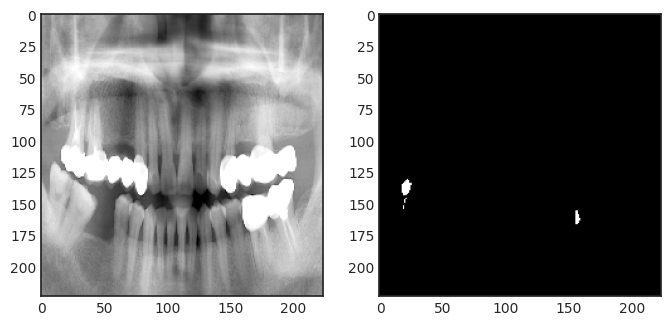

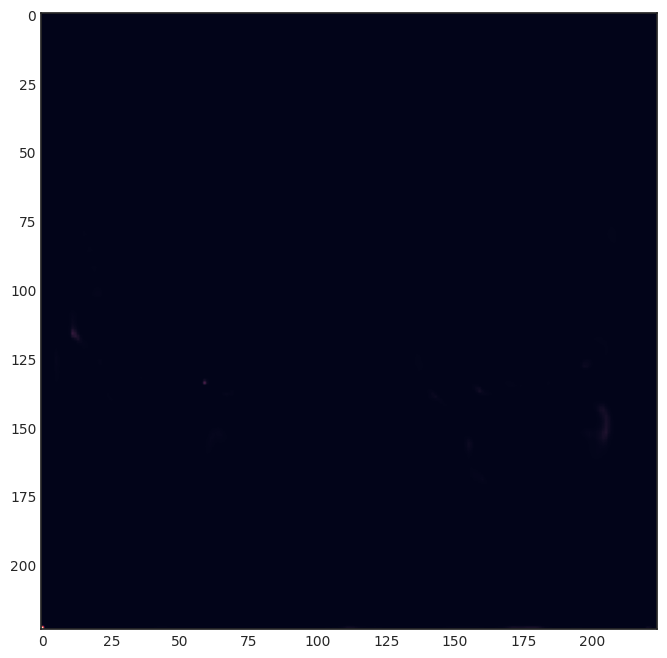

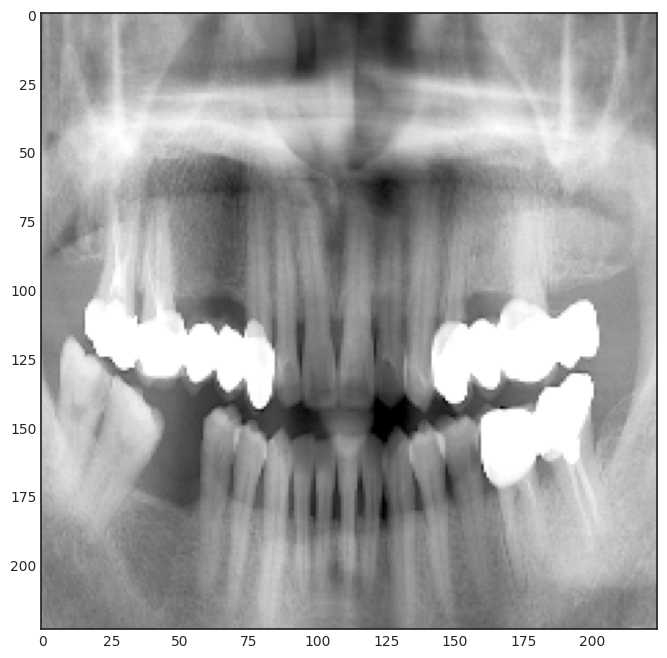

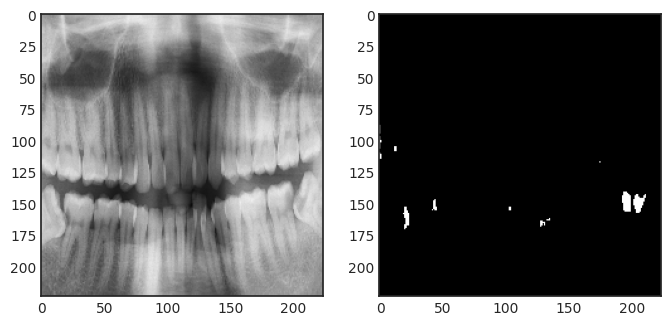

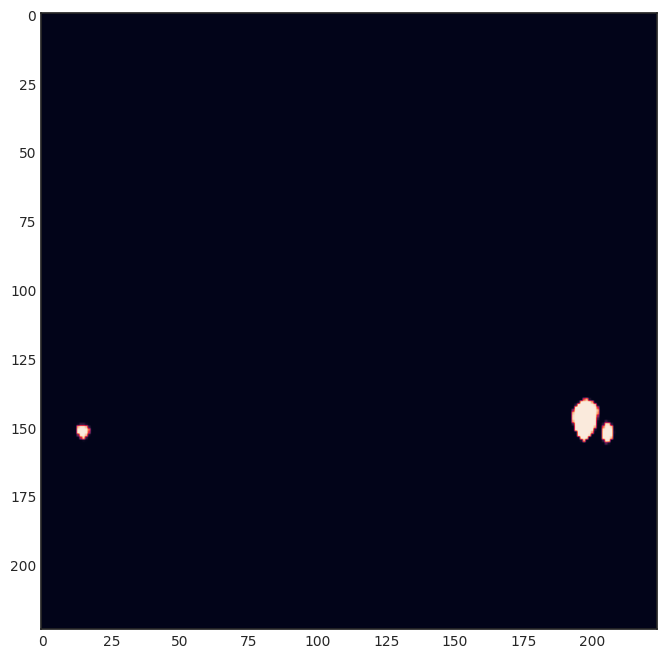

...

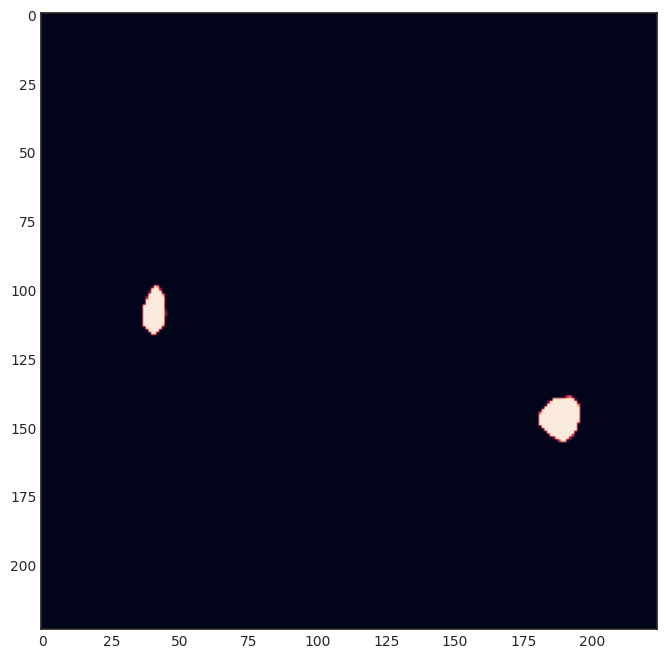

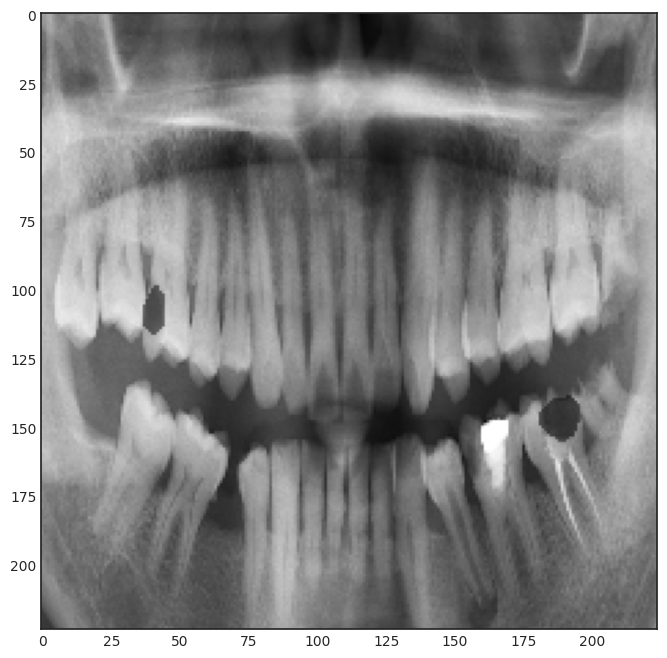

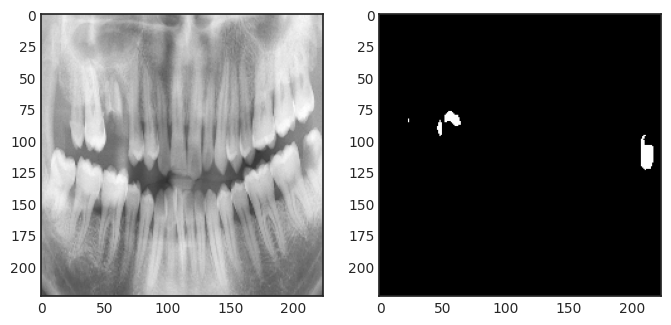

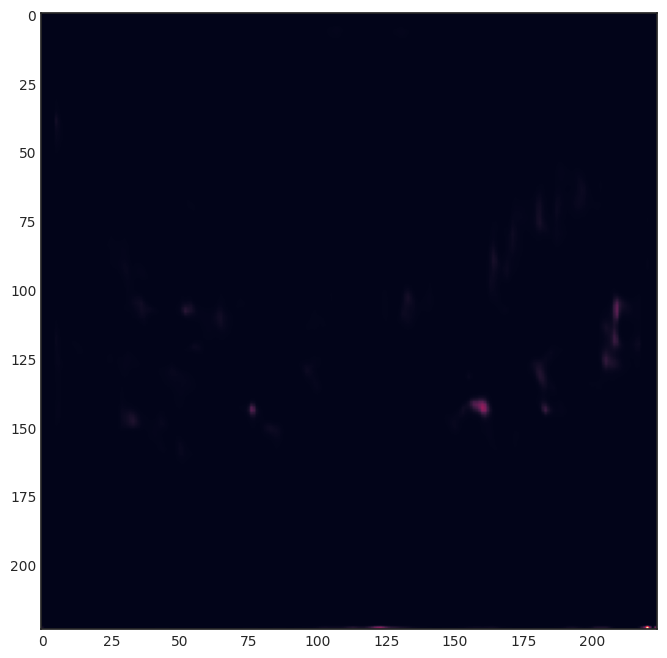

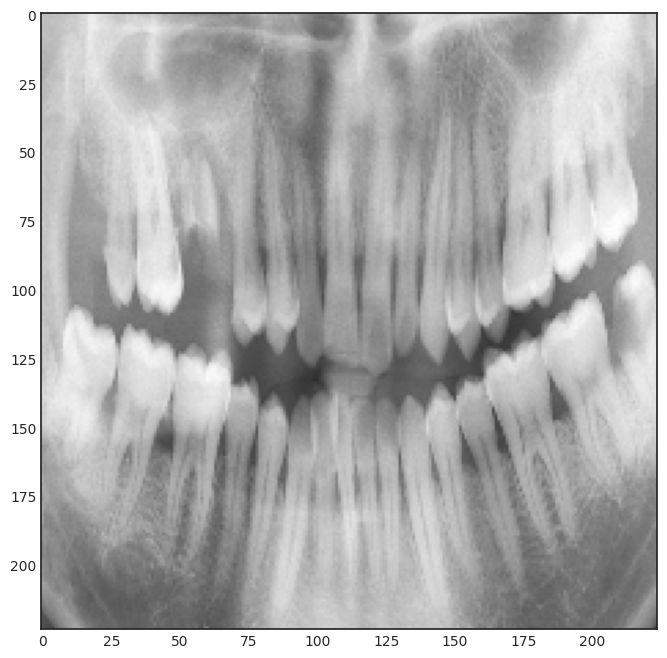

In [ ]:
test_image_path = val_files[5]
save_path = '/content/drive/MyDrive/TCC/resultados_densenet_mean_iou'

for i in range(len(val_files)):

  test_image_path = val_files[i]
  image = '/content/drive/MyDrive/TCC/images_cut/' + test_image_path
  img = img_to_array(load_img(image, target_size=(img_w_target, img_h_target, 3))) / 255
  print(img.shape)

  mask = '/content/drive/MyDrive/TCC/labels_cut/' + test_image_path
  mask_img = img_to_array(load_img(mask, target_size=(img_w_target, img_h_target, 3)))

  print(test_image_path)

  plt.figure(figsize=(8,8))
  plt.subplot(121)
  plt.imshow(img)
  plt.subplot(122)
  plt.imshow(mask_img/255.)

  plt.savefig(save_path + '/' + str(i) + '.sample_mask.png')

  plt.figure(figsize=(8,8))

  predicted_mask = make_prediction(model,image,(img_w_target, img_h_target, 3))[0]
  plt.imshow(predicted_mask)
  plt.savefig(save_path + '/' + str(i) + '.predicted_mask.png')

  plt.figure(figsize=(8,8))

  plt.imshow(overlay_mask(img, predicted_mask.squeeze(),color=(255, 0, 0), alpha=0.5))

  plt.savefig(save_path + '/' + str(i) + '.overlay_mask.png')
